# Color Extraction Using Cosine Similarity

## Cosine Similarity
- determining similarity between two non-zero vectors based on Euclidean dot product

#### Euclidian Dot Product
$$u \cdot v = \|u\|\|v\| cos(\theta)$$
where  ‖𝑢‖  and  ‖𝑣‖  represents normed vectors.

#### similarity =
$$cos(\theta) = {{u \cdot v}\over{\|u\|\|v\|}} = {{{\Sigma_{i=1}^{n}u_i}+{\Sigma_{i=1}^{n}v_i}}\over{{\sqrt{\Sigma_{i=1}^{n}u_i^2}}{\sqrt{ \Sigma_{i=1}^{n}v_i^2}}}}$$

**NOTE**: vector divided by the normed vector is the unit vector (vector with length=1), therefore, $cos(\theta)$ = the product of unit vectors. <br>

Since the range of $cos(\theta)$ is [0, 1] when the range of $\theta$ is [0, $\pi\over{2}$], it can be said that two vectors are similar when $\theta = 0$ (parallel) with $cos(\theta) = 1$ and dissimilar when $\theta = {\pi\over{2}}$. (orthogonal) with $cos(\theta) = 0$.

## Hypothesis

Since images are vectors with shape (height, width, color), we can deternmine how similar an image is to a certain color.


In [1]:
import numpy as np
import matplotlib.pyplot as plt

## Color Similarity

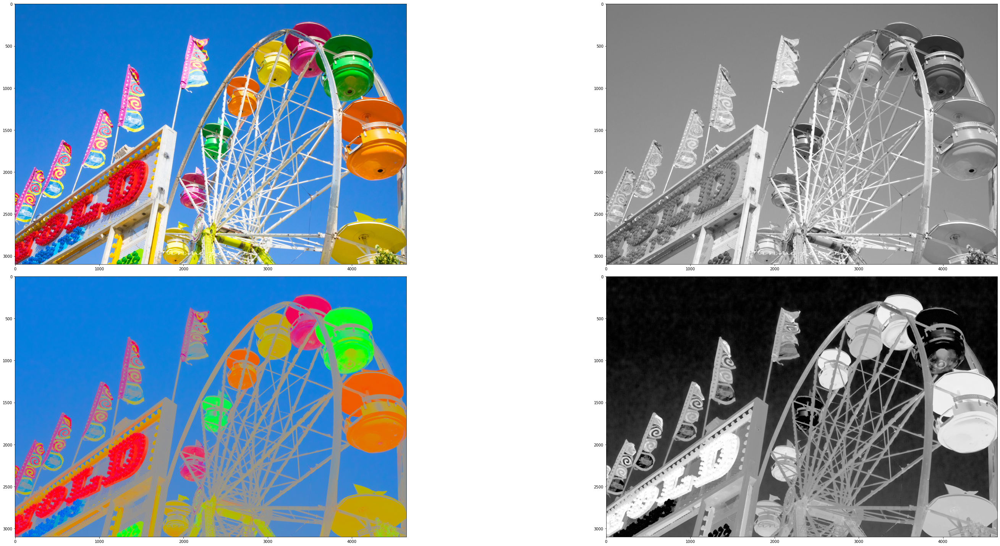

In [2]:
# read image, change data type from unit8 to float64 (calculatable)
img = plt.imread('/data/image.jpg').astype(np.float64)
img_h, img_w = img.shape[0], img.shape[1]

# read each R G B values
r_channel, g_channel, b_channel = img[..., 0], img[..., 1], img[..., 2]

# get nomred image vector by square rooting the sum of squared each RGB valeus
img_norm = np.sqrt(r_channel**2 + g_channel**2 + b_channel**2)

# get unit vector by dividing the image vector with the normed vector
img_unit = img / img_norm.reshape((img_h, img_w, 1)) # create unit vector

# sets a target vector
R, G, B = 255, 0, 0 # target color: red
color = np.array([R, G, B])
color_norm = np.sqrt(R**2 + G**2 + B**2)
color_unit = color / color_norm

# get similarity by multiplying the unit vectors
img_dot = np.sum(img_unit * color_unit, axis=-1)

# results
fig, axes = plt.subplots(2, 2, figsize=(50, 20))
axes[0, 0].imshow(img.astype(np.uint8)) # original
axes[0, 1].imshow(img_norm, 'gray')     # normed vector
axes[1, 0].imshow(img_unit, 'gray')     # unit vector
axes[1, 1].imshow(img_dot, 'gray')      # similarity

fig.tight_layout()
plt.show()


## Result
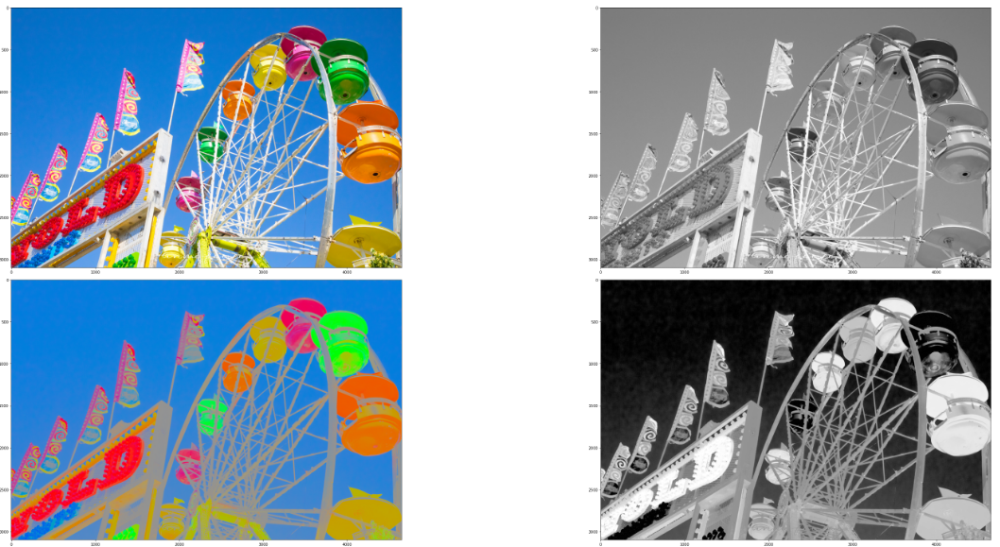

Closer to the target value, cos(theta) gets close to 0, meaning lighter color <br>
Farther, cos(theta) gets close to 1, meaning darker

## Color Extraction

Now that we examined the how color similarity works, we can extract a target color with cerain similarity value between 0 and 1.

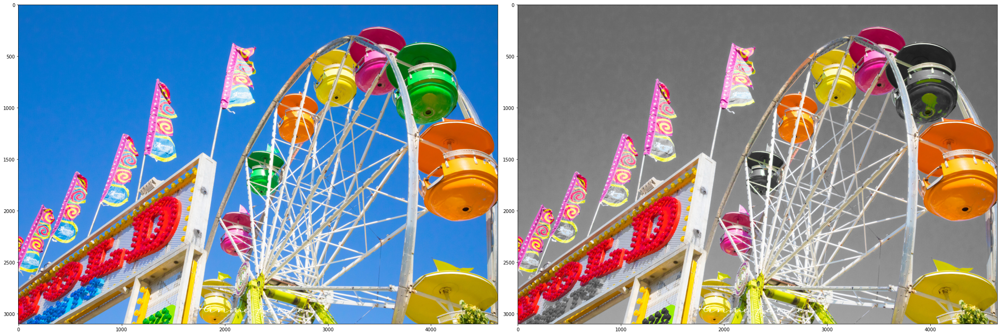

In [3]:
# Constant variables
R, G, B = 255., 0., 0. # target color: red
CUTOFF = 0.5           # threshold for color extraction

# read image
img = plt.imread('/data/image.jpg').astype(np.float64)
img_h, img_w = img.shape[0], img.shape[1]

# make image gray
# unextracted pixels will be shown as gray
img_ch_mean = np.mean(img, axis=-1)
img_gray = np.dstack((img_ch_mean, img_ch_mean, img_ch_mean)) # stack the mean values 
                                                              # to the shape of the image

# read each R G B values
r_channel, g_channel, b_channel = img[..., 0], img[..., 1], img[..., 2]

# Normed and Unit Vector
img_norm = np.sqrt(r_channel**2 + g_channel**2 + b_channel**2)
img_unit = img / img_norm.reshape((img_h, img_w, 1)) # create unit vector

# sets a target vector
color = np.array([R, G, B])
color_norm = np.sqrt(R**2 + G**2 + B**2)
color_unit = color / color_norm

# get similarity
img_dot = np.sum(img_unit * color_unit, axis=-1)

# select indices that passed the threshold by creating boolean list
indices_bool = img_dot > CUTOFF
n_indices_bool = img_dot <= CUTOFF

bg_img = np.zeros_like(img)
bg_img[indices_bool] = img[indices_bool] # for colors that passed the threshold, show the image
bg_img[n_indices_bool] = img_gray[n_indices_bool] # not passed, show gray image

fig, axes = plt.subplots(1, 2, figsize=(30, 10))
axes[0].imshow(img.astype(np.uint8)) # origimal image
axes[1].imshow(bg_img.astype(np.uint8)) # color extracted image
fig.tight_layout()
plt.show()

## Result
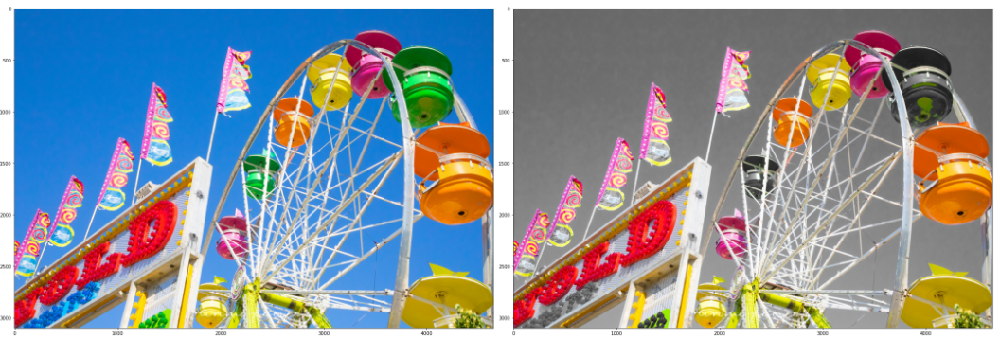

As you can see in the image above, the blue part of the image turned gray and red-like colors only remained. There can be some green or non-red colors because the threshold was 0.5, not 1 (which would mean complete red).

# Further Studies
However when the color target is set to white (255, 255, 255), the color extraction fails and all the colors gets shown.
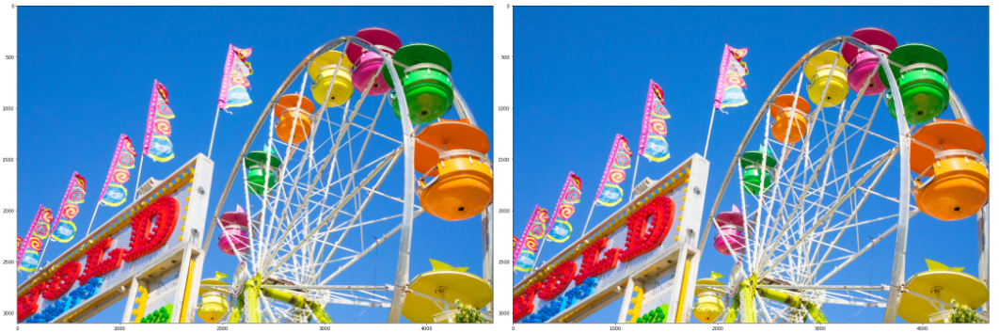

This may by due to the fact that the image is using RGB color system.
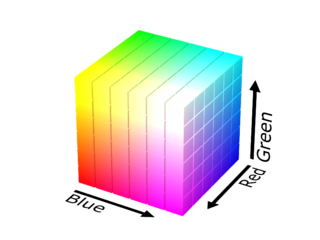

There are other color systems, such as HSL (Hue Saturation Lightness) and HSV (Hue Saturation Value).
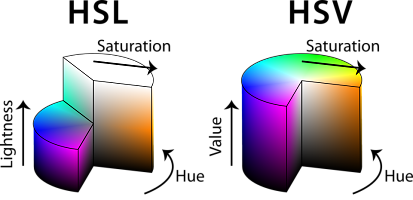

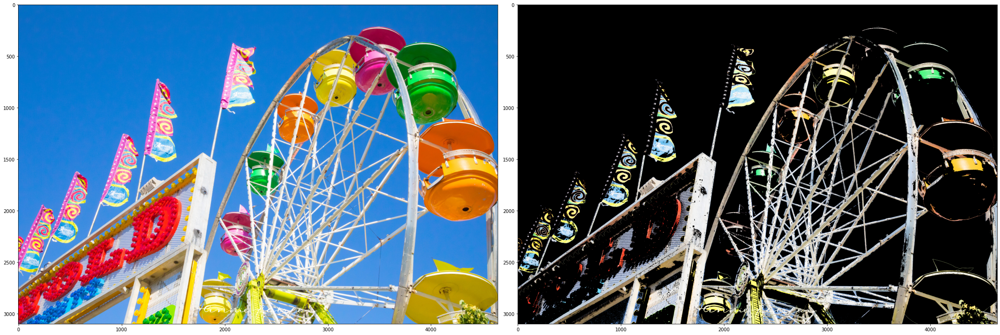

In [9]:
import matplotlib.colors as clr

# Constant variables
H, S, V = 0., 0., 1. # target color: white
CUTOFF = 0.75           # threshold for color extraction

# read image
img = plt.imread('/data/image.jpg').astype(np.float64)
img_hsv = img / 255
img_hsv = clr.rgb_to_hsv(img_hsv)
img_h, img_w = img.shape[0], img.shape[1]

# make image gray
# gray in hsv is [x, 0, 50%]
h_gray = img_hsv[..., 0]
s_gray = np.zeros((img_h, img_w, 1))
v_gray = np.full((img_h, img_w, 1), 0.5)

img_gray = np.dstack((h_gray, s_gray, v_gray))

# read each R G B values
h_channel, s_channel, v_channel = img_hsv[..., 0], img_hsv[..., 1], img_hsv[..., 2]

# Normed and Unit Vector
img_norm = np.sqrt(h_channel**2 + s_channel**2 + v_channel**2)
img_unit = img_hsv / img_norm.reshape((img_h, img_w, 1)) # create unit vector

# sets a target vector
color = np.array([H, S, V])
color_norm = np.sqrt(H**2 + S**2 + V**2)
color_unit = color / color_norm

# get similarity
img_dot = np.sum(img_unit * color_unit, axis=-1)

# select indices that passed the threshold by creating boolean list
indices_bool = img_dot > CUTOFF
n_indices_bool = img_dot <= CUTOFF

bg_img = np.zeros_like(img)
bg_img[indices_bool] = img[indices_bool] # for colors that passed the threshold, show the image
bg_img[n_indices_bool] = img_gray[n_indices_bool] # not passed, show gray image

fig, axes = plt.subplots(1, 2, figsize=(30, 10))
axes[0].imshow(img.astype(np.uint8)) # origimal image
axes[1].imshow(bg_img.astype(np.uint8)) # color extracted image
fig.tight_layout()
plt.show()

**Current issue**: non-white areas are shown as black not gray. there are still some non-white colors mixed in to the color extraction.
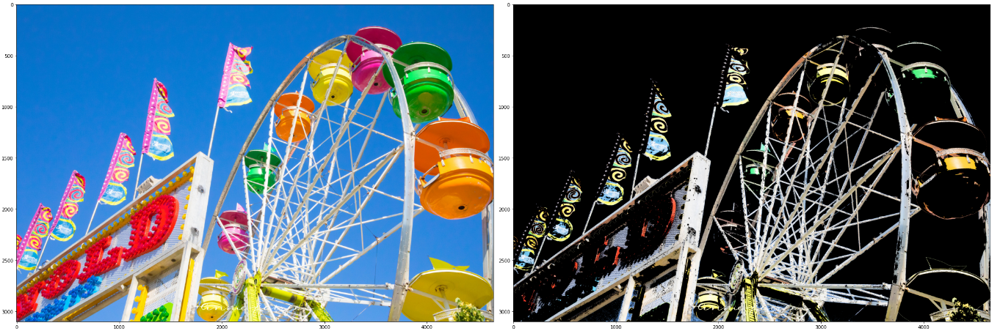

# Referances:
- image: https://anniewearsit.com/worlds-colorful-carnival/
- Cosine Similarity: https://en.wikipedia.org/wiki/Cosine_similarity
- HSL and HSV: https://en.wikipedia.org/wiki/HSL_and_HSV
- RGB vs HSB vs HSL: https://medium.com/innovaccer-design/rgb-vs-hsb-vs-hsl-demystified-1992d7273d3a
- RGB cube: https://commons.wikimedia.org/wiki/File:RGB_color_solid_cube.png